In [39]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
import cv2
from numba import jit
from modules.process import Process
from modules.edge import get_bright_edge
from modules.mass_center import compute_mass_center
from modules.bright2dark import get_b2d_data
from modules.dense_area import get_dense_area
from modules.grouping import divideIntoGroups
from modules.helper import get_extention_tag, get_dilated_mask, display_images
from modules.fft import lowpass_filter
from config import base_dir

In [ ]:
def get_neighbour_points(binary_image, x, y):
    dp1 = [(1, 0), (-1, 0), (0, 1), (0, -1)]
    dp2 = [(1, 1), (1, -1), (-1, 1), (-1, -1)]
    k = np.ones((3, 3))
    k[1, 1] = 0
    res = []
    for d in dp1:
        dx, dy = d
        nx, ny = x + dx, y + dy
        if binary_image[ny, nx] == 1:
            k[1 + dy, 1 + dx] = 0
            res.append((nx, ny))
    if len(res) >= 3:
        print('Input point is invalid.')
        return None
    if len(res) == 2:
        return res
    for d in dp2:
        dx, dy = d
        nx, ny = x + dx, y + dy
        if binary_image[ny, nx] == 1 and k[1 + dy, 1 + dx] == 1:
            res.append((nx, ny))
    if len(res) >= 3:
        print('Input point is invalid.')
        return None
    return res

points = {}
end_points = []
for y in range(binary_image.shape[0]):
    for x in range(binary_image.shape[1]):
        if binary_image[y, x] == 1:
            neighbour_points = get_neighbour_points(binary_image, x, y)
            if neighbour_points is None:
                print('Too many branch was found:', (x, y))
                return None
            points[(x, y)] = neighbour_points
            if len(neighbour_points) == 1:
                end_points.append((x, y))
print(end_points)
if len(end_points) == 2:
    arr = []
    now = end_points[0]
    while(now != end_points[1]):
        done = True
        for neighbour_point in points[now]:
            if neighbour_point not in arr:
                done = False
                arr.append(neighbour_point)
                now = neighbour_point
                break
        if done:
            break
    print(arr)


In [2]:
def delete_drawings(image):
    ret = cv2.circle(image, (375, 356), 80, 0, thickness=5)
    ret[:100, :300] = 0
    ret[600:, 580:] = 0
    return ret

In [3]:
filenames = [f for f in os.listdir(base_dir) if get_extention_tag(f) == 'tif']
paths = [base_dir + f for f in filenames]
p = Process(paths)

In [69]:
def test_run(gray):
    # mass center
    dilated_dust_mask = get_dilated_mask(p.dust_mask)
    cx, cy = compute_mass_center(gray, dilated_dust_mask)

    # edge points
    edge = get_bright_edge(gray)
    edge[dilated_dust_mask == 1] = 0
    edge = delete_drawings(edge)

    # b2d data
    blurred = cv2.GaussianBlur(gray, ksize=(7, 7), sigmaX=0, sigmaY=0)
    b2d_vector_image, cos_image = get_b2d_data(blurred, cx, cy, sobel_ksize=3)

    # b2d mask
    b2d_mask = np.ones(gray.shape)
    b2d_mask[cos_image < 0.3] = 0
    b2d_mask[b2d_vector_image < np.mean(b2d_vector_image)] = 0
    b2d_mask = delete_drawings(b2d_mask)
    group_sizes, grouped = divideIntoGroups(b2d_mask, ksize=3)
    small_group_mask = np.zeros(b2d_mask.shape)
    for group_id, group_size in enumerate(group_sizes):
        if group_size < 50:
            small_group_mask[grouped == group_id] = 1
    new_b2d_mask = np.copy(b2d_mask)
    new_b2d_mask[small_group_mask == 1] = 0

    # 境界点群の絞り込み
    new_edge = np.copy(edge)
    new_edge[new_b2d_mask == 0] = 0
    new_edge_binary = np.copy(new_edge)
    new_edge_binary[new_edge_binary > 0] = 1
    new_edge_binary = cv2.dilate(new_edge_binary, kernel=(5, 5))

    images = [gray, edge, b2d_vector_image, cos_image, b2d_mask, new_b2d_mask, new_edge, new_edge_binary]
    names = ['gray', 'edge', 'b2d_vector', 'b2d_cos', 'b2d_mask', 'new_b2d_mask', 'new_edge', 'new_edge_binary']
    w = len(images) // 2
    display_images(images, names, w)
    return images

2 4 8


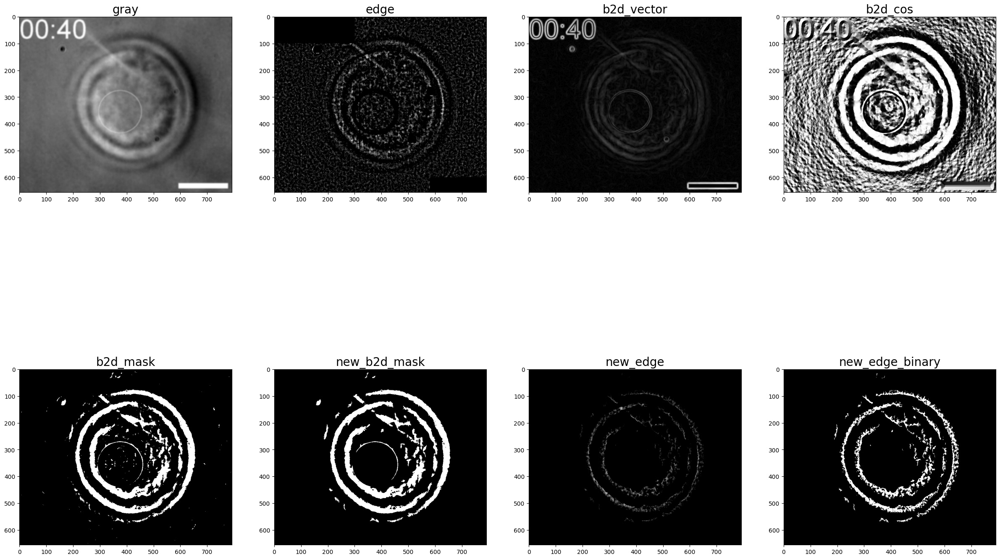

In [5]:
index = 40
gray = p.gray_images[index].copy()
test_run(gray)

2 4 8


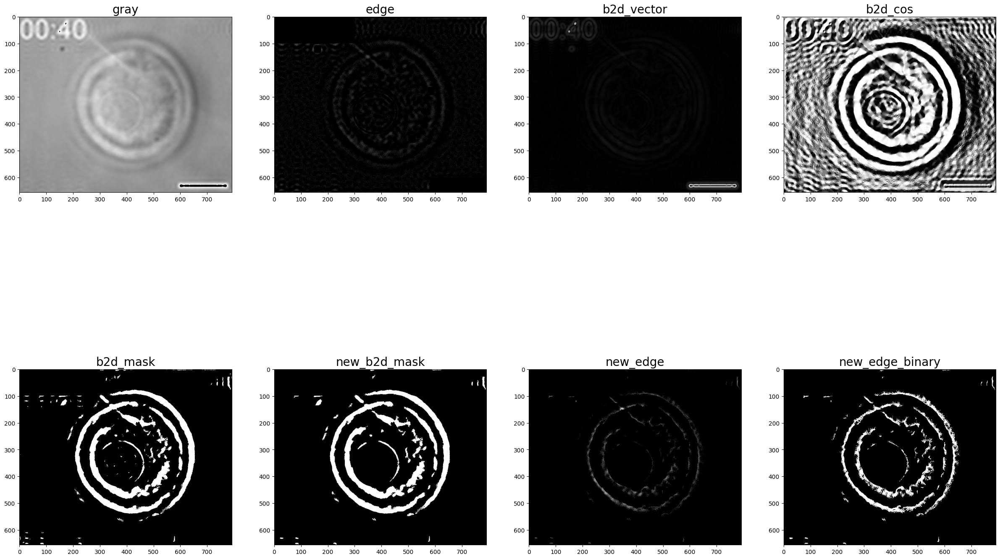

In [6]:
param = 0.1
gray_lpf = lowpass_filter(gray, param)
test_run(gray_lpf)

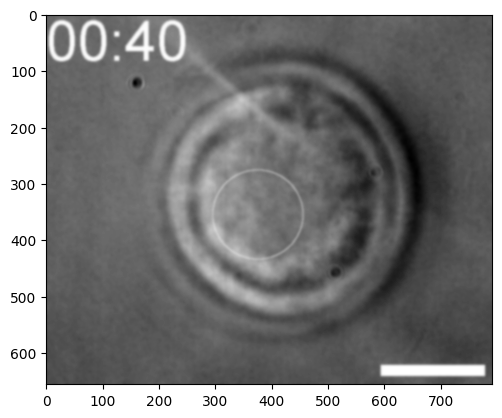

In [7]:
index = 40

gray = p.gray_images[index]
plt.imshow(gray, cmap='gray')

In [8]:
# mass center
dilated_dust_mask = get_dilated_mask(p.dust_mask)
cx, cy = compute_mass_center(gray, dilated_dust_mask)
cx, cy

(397.69222932419086, 330.23997714376833)

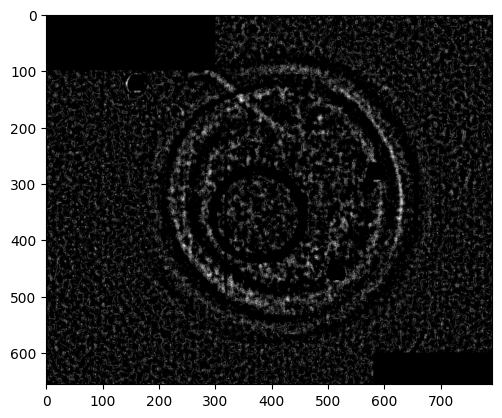

In [9]:
# 境界点群
edge = get_bright_edge(gray)
edge[dilated_dust_mask == 1] = 0
edge = delete_drawings(edge)
plt.imshow(edge, cmap='gray')

1 2 2


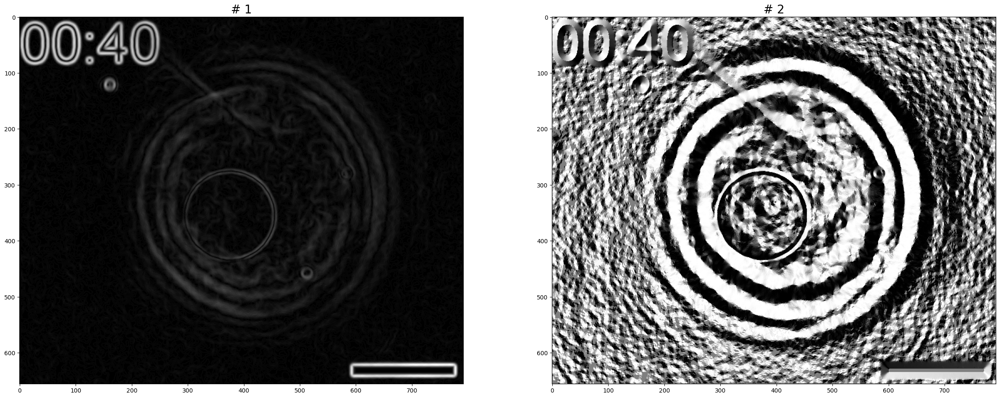

In [10]:
# b2d mask
blurred = cv2.GaussianBlur(gray, ksize=(7, 7), sigmaX=0, sigmaY=0)
b2d_vector_image, cos_image = get_b2d_data(blurred, cx, cy, sobel_ksize=3)
display_images([b2d_vector_image, cos_image])

1 2 2


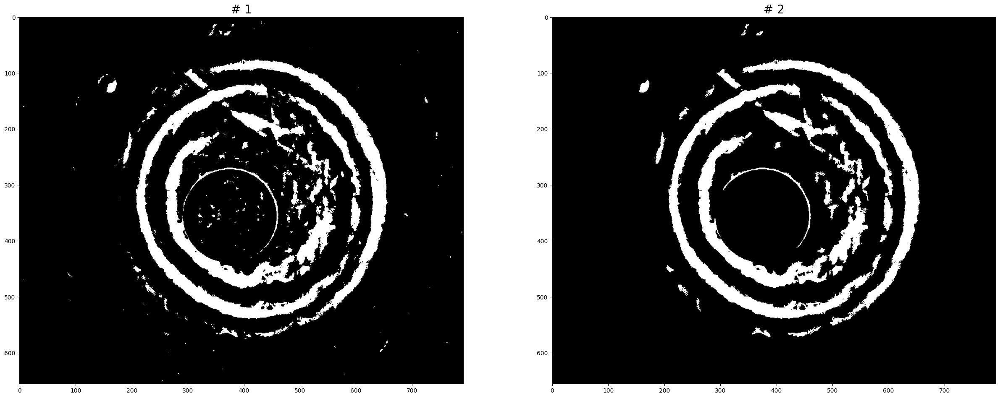

In [11]:
b2d_mask = np.ones(gray.shape)
b2d_mask[cos_image < 0.3] = 0
b2d_mask[b2d_vector_image < np.mean(b2d_vector_image)] = 0
b2d_mask = delete_drawings(b2d_mask)
group_sizes, grouped = divideIntoGroups(b2d_mask, ksize=3)
small_group_mask = np.zeros(b2d_mask.shape)
for group_id, group_size in enumerate(group_sizes):
    if group_size < 50:
        small_group_mask[grouped == group_id] = 1
new_b2d_mask = np.copy(b2d_mask)
new_b2d_mask[small_group_mask == 1] = 0
display_images([b2d_mask, new_b2d_mask])

1 4 4


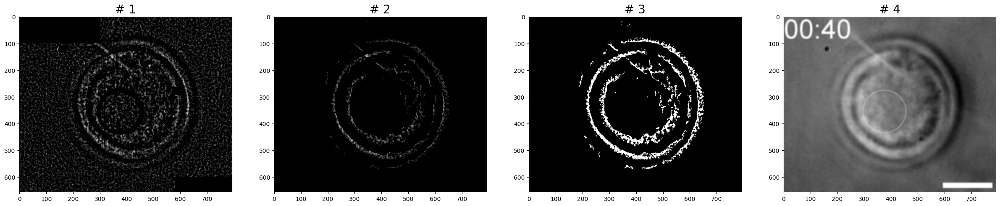

In [12]:
# 境界点群の絞り込み
new_edge = np.copy(edge)
new_edge[new_b2d_mask == 0] = 0
# new_edge = (new_edge / np.max(new_edge)) * 255
# new_edge_blurred = cv2.medianBlur(new_edge.astype('uint8'), ksize=5) #ごま塩ノイズ除去
# new_edge_blurred = cv2.blur(new_edge_blurred, ksize=(3, 3))
# new_edge_blurred[new_edge_blurred > 0] = 1
new_edge_binary = np.copy(new_edge)
new_edge_binary[new_edge_binary > 0] = 1
new_edge_binary = cv2.dilate(new_edge_binary, kernel=(5, 5))
display_images([edge, new_edge, new_edge_binary, gray])

In [65]:
# 楕円検出
contours, hierarchy = cv2.findContours(new_edge_binary.astype('uint8'), cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)
"""
hierarchy: next contour in the same layer, previous contour in the same layer, child contour, parent contour
"""
contours


(array([[[430, 569]],
 
        [[430, 571]]], dtype=int32),
 array([[[363, 564]],
 
        [[363, 566]]], dtype=int32),
 array([[[449, 563]],
 
        [[444, 565]],
 
        [[438, 566]],
 
        [[433, 566]],
 
        [[422, 565]],
 
        [[422, 567]],
 
        [[424, 569]],
 
        [[426, 568]],
 
        [[429, 566]],
 
        [[437, 568]],
 
        [[438, 570]],
 
        [[440, 569]],
 
        [[443, 568]],
 
        [[446, 571]],
 
        [[447, 568]],
 
        [[450, 569]],
 
        [[453, 568]],
 
        [[453, 563]]], dtype=int32),
 array([[[379, 561]],
 
        [[379, 563]],
 
        [[381, 565]],
 
        [[385, 567]],
 
        [[383, 567]],
 
        [[383, 570]],
 
        [[388, 570]],
 
        [[389, 572]],
 
        [[389, 570]],
 
        [[388, 567]],
 
        [[387, 565]],
 
        [[385, 563]],
 
        [[382, 562]],
 
        [[382, 560]]], dtype=int32),
 array([[[381, 563]]], dtype=int32),
 array([[[371, 560]],
 
        [[371, 563]],
 

In [66]:
indices = [i for i in range(len(contours)) if len(contours[i]) > 100]
print(indices)

[42, 71, 76, 211, 280, 340, 398, 423, 433]


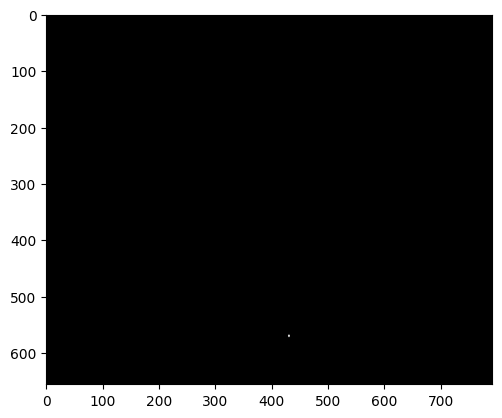

In [68]:
tmp = np.zeros(gray.shape)
cv2.drawContours(tmp, contours, 0, 1, 2)
plt.imshow(tmp, cmap='gray')

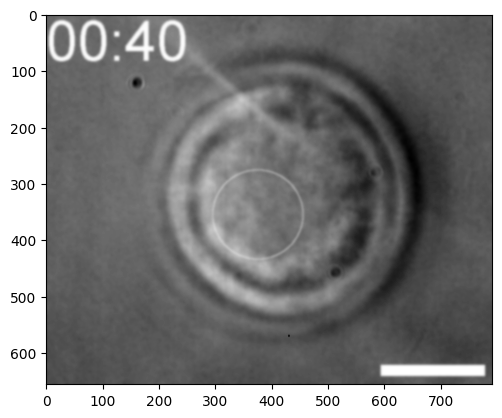

In [ ]:
canvas = np.copy(gray)

index = 433
c = contours[index]
cv2.drawContours(canvas, [c], 0, 100, 2)
plt.imshow(canvas, cmap='gray')
    

In [16]:
cx, cy

(397.69222932419086, 330.23997714376833)

((411.90386962890625, 328.43316650390625), (379.4012756347656, 390.5158386230469), 154.32290649414062)
1 2 2


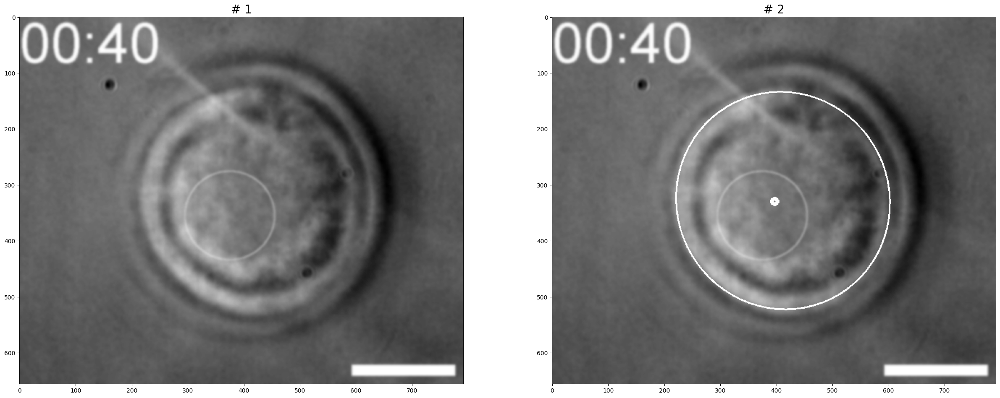

In [17]:
# 重心からの距離でcontoursを絞り込む
cs = np.concatenate([contours[340], contours[398], contours[423]])
# np.concatenate([c for c in contours if len(c) >= 5])
e = cv2.fitEllipseAMS(cs)
print(e)

canvas = np.copy(gray)
cv2.ellipse(canvas, e, 255, 2)
cv2.circle(canvas, (int(cx), int(cy)), 5, 255, 5)
display_images([gray, canvas])

1 2 2


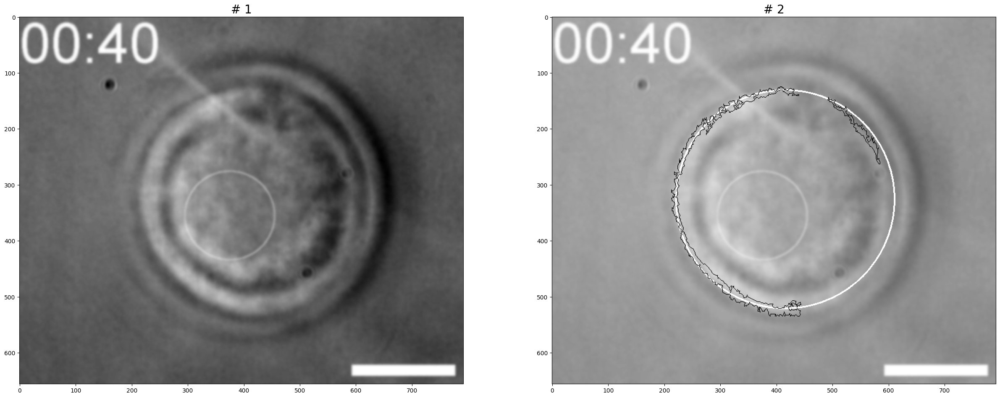

In [63]:
"""
円近似してcontourを絞り込む
-> 楕円近似でより正確に近似する
"""

# 輪郭を円で近似

j = 340
contour = contours[j]
# A = np.array([[p[0][0], p[0][1], 1] for p in contour])
# print(A)

# v = np.sum(np.array(np.square(A.T[:2].T)), axis=1)

# #QR分解
# Q, R = np.linalg.qr(A)

# # x = ( 2*x_0, 2*y_0, r^2-x0^2-y0^2 )
# x = np.linalg.inv(R)@Q.T@v

# #解 
# x_0 = x[0]/2 #円の中心座標
# y_0 = x[1]/2 #円の中心座標
# squared_r = x[2] + x_0**2 + y_0**2

# print(x_0, y_0, squared_r, np.sqrt(squared_r))
def fit2circle(contours):
    A = np.concatenate([np.array([[p[0][0], p[0][1], 1] for p in contour]) for contour in contours])
    v = np.sum(np.array(np.square(A.T[:2].T)), axis=1)

    #QR分解
    Q, R = np.linalg.qr(A)

    # x = ( 2*x_0, 2*y_0, r^2-x0^2-y0^2 )
    x = np.linalg.inv(R)@Q.T@v

    #解
    x_0 = x[0]/2 #円の中心座標
    y_0 = x[1]/2 #円の中心座標
    radius = np.sqrt(x[2] + x_0**2 + y_0**2)

    return x_0, y_0, radius

x, y, r = fit2circle([contour])
canvas = gray.copy()
cv2.circle(canvas, (int(x), int(y)), int(r), 255, 2)
cv2.drawContours(canvas, [contours[340]], 0, 0, 1)
cv2.drawContours(canvas, [contours[398]], 0, 0, 1)
cv2.drawContours(canvas, [contours[423]], 0, 0, 1)
display_images([gray, canvas])

In [47]:
contours[340]

array([[[302, 161]],

       [[300, 162]],

       [[298, 163]],

       [[298, 166]],

       [[299, 172]],

       [[297, 174]],

       [[295, 175]],

       [[293, 174]],

       [[292, 176]],

       [[292, 179]],

       [[290, 179]],

       [[289, 181]],

       [[288, 178]],

       [[285, 177]],

       [[283, 178]],

       [[282, 180]],

       [[282, 183]],

       [[281, 184]],

       [[282, 188]],

       [[277, 190]],

       [[276, 187]],

       [[275, 180]],

       [[274, 185]],

       [[272, 181]],

       [[271, 184]],

       [[270, 187]],

       [[269, 182]],

       [[267, 190]],

       [[266, 193]],

       [[263, 194]],

       [[261, 197]],

       [[260, 194]],

       [[259, 196]],

       [[258, 197]],

       [[258, 201]],

       [[256, 205]],

       [[254, 205]],

       [[253, 208]],

       [[251, 208]],

       [[251, 210]],

       [[252, 211]],

       [[254, 214]],

       [[250, 214]],

       [[250, 212]],

       [[249, 211]],

       [[2

radius
235
center
414 328
radius
185
center
464 312
radius
185
center
426 272
radius
182
center
450 364
radius
185
center
372 280
radius
188
center
360 350
radius
186
center
394 404
radius
138
center
422 222
radius
127
center
522 340
radius
148
center
478 262
radius
120
center
498 408
radius
168
center
320 318
radius
116
center
526 286
radius
101
center
442 430
radius
116
center
348 236
1 1 1


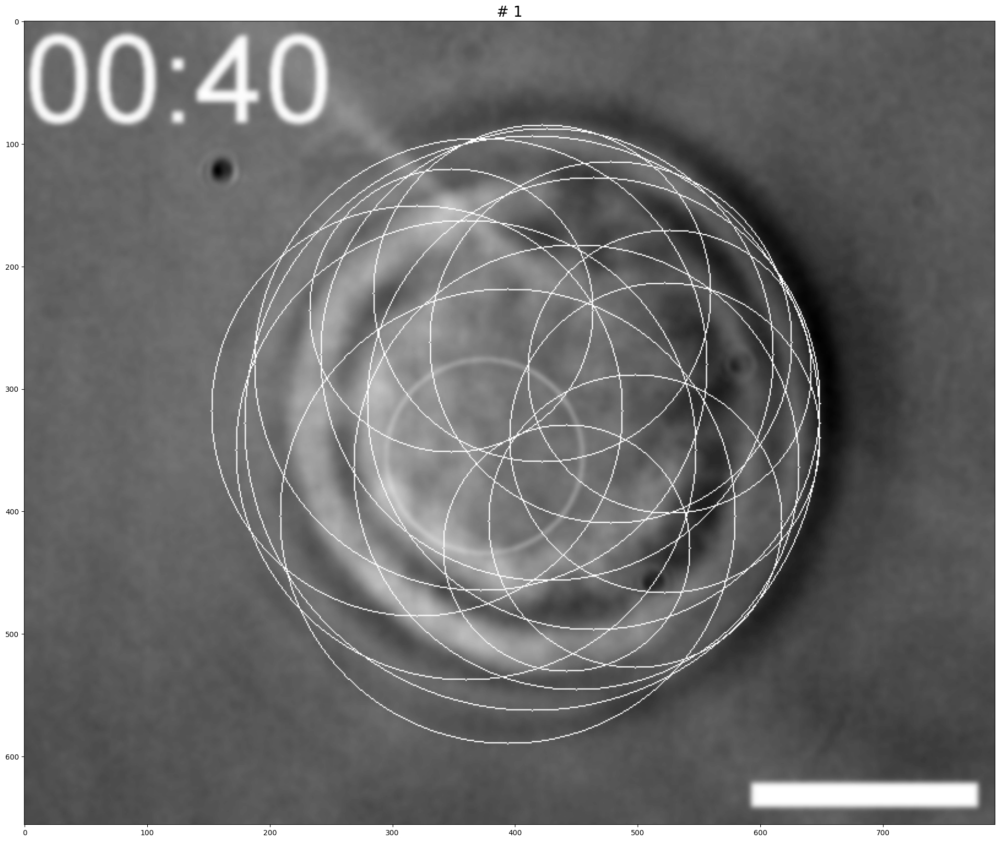

In [ ]:
# 液滴を円と仮定して、Hough 変換
# 使えない

circles = cv2.HoughCircles(new_edge_binary.astype('uint8'), cv2.HOUGH_GRADIENT,
                            dp=1,
                            minDist=50,
                            param1=1,
                            param2=30,
                            minRadius=100,
                            maxRadius=300,
                            )
img_dst = gray.copy()
try:
    circles = np.uint16(np.around(circles))

    for circle in circles[0, :]:
        # 円周を描画する
        cv2.circle(img_dst, (circle[0], circle[1]), circle[2], 255, 1)
        print('radius')
        print(circle[2])

        # 中心点を描画する
        # cv2.circle(img_dst, (circle[0], circle[1]), 2, 255, 3)
        print('center')
        print(circle[0], circle[1])
        
    # 4. Plotting
    display_images([img_dst])
    
except:
    pass